In [1]:
import numpy as np
import cvxpy as cp
import pandas as pd
import matplotlib.pyplot as plt
import random
from joblib import Parallel, delayed
from multiprocessing import cpu_count
import seaborn as sns
from sklearn.linear_model import LogisticRegression
import statsmodels.api as sm

#### In this notebook, we explore the idea that factor components are important for panel data models, and as a result TWFE based models have significant omitted variable bias. A direct way to demonstrate this idea is to extract the leading factor from the matrix of residuals of a TWFE regression, then show that i) it has predictive power on outcomes of a held-out set/is correlated on the regional level and ii) it is also correlated with the treatment assignment. We start with the CPS data and then perform similar procedures on DiD datasets used in some previous works.

## CPS Data

In [2]:
df = pd.read_csv('CPS.csv',sep=';')
Y_true_full = np.reshape(df['log_wage'].values, (40,-1))
Y_true_full = Y_true_full.T
Y_true_full /= np.std(Y_true_full)
Y_true_full -= np.mean(Y_true_full)
N_total,T_total = Y_true_full.shape

In [3]:
df

,state,year,log_wage,hours,urate,min_wage,open_carry,abort_ban
0,AK,1979,-0.759183,37.504,0.073,False,False,False
1,AL,1979,-2.269627,36.289,0.065,False,False,False
2,AR,1979,-2.225654,37.182,0.060,False,False,False
3,AZ,1979,-1.724803,38.692,0.045,False,False,False
4,CA,1979,-1.651739,36.578,0.060,False,False,False
...,...,...,...,...,...,...,...,...
1995,VT,2018,1.676063,38.760,0.027,True,True,True
1996,WA,2018,1.702448,36.485,0.033,True,False,True
1997,WI,2018,1.311645,35.916,0.009,False,True,False
1998,WV,2018,1.264739,36.563,0.055,False,True,False


In [4]:
Y_true_full.shape

(50, 40)

In [5]:
states = list(df['state'][:50])

## Treatment Vector

In [6]:
treatment = np.reshape(df['min_wage'].values, (40,-1))
treatment = treatment.T

In [7]:
np.argwhere(treatment==True)

array([[ 4, 39],
       [ 6, 39],
       [ 7, 39],
       [18, 39],
       [36, 39],
       [38, 39],
       [45, 39],
       [46, 39]])

In [8]:
Ds = np.argwhere(treatment==True)[:,0]
Ds

array([ 4,  6,  7, 18, 36, 38, 45, 46])

In [9]:
assignment_vector = np.zeros((N_total,))
assignment_vector[Ds] = 1

In [10]:
assignment_vector

array([0., 0., 0., 0., 1., 0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 1., 0., 1., 0., 0., 0., 0., 0., 0., 1., 1., 0., 0., 0.])

## TWFE Regression with 1 Factor to Extract Unit Loadings

In [11]:
def TWFE_one_factor(Y, M, iters=100):
    units, times = Y.shape
    
    time_factors = np.ones((1,times))

    # polishing effect of OSQP results in not truly weighting by zero; use cp.sum_squares instead of
    #objective = cp.sum(cp.multiply(cp.square(Y-unit_factor-time_factor),W))
    
    # iterate between updating unit and time loadings
    for i in range(iters):
        
        unit_effect = cp.Variable((1,units))
        time_effect = cp.Variable((1,times))
        unit_effects = cp.kron(np.ones((times,1)),unit_effect).T
        time_effects = cp.kron(np.ones((units,1)),time_effect)
        mu = cp.Variable()
        
        unit_loadings = cp.Variable((units,1))
    
        
        objective = cp.sum_squares(cp.multiply(Y-unit_effects-time_effects-mu-unit_loadings@time_factors,M))

        constraints = []

        prob = cp.Problem(cp.Minimize(objective),
                          constraints)
        prob.solve()
        unit_loadings = unit_loadings.value    
        
        print(unit_loadings[0])
                
        unit_effect = cp.Variable((1,units))
        time_effect = cp.Variable((1,times))
        unit_effects = cp.kron(np.ones((times,1)),unit_effect).T
        time_effects = cp.kron(np.ones((units,1)),time_effect)
        mu = cp.Variable()
        
        time_factors = cp.Variable((1,times))
        
        objective = cp.sum_squares(cp.multiply(Y-unit_effects-time_effects-mu-unit_loadings@time_factors,M))

        constraints = [cp.sum(time_factors)==times]

        prob = cp.Problem(cp.Minimize(objective),
                          constraints)
        prob.solve()
        time_factors = time_factors.value
                
    return unit_loadings, time_factors, unit_effect.value.T+time_effect.value+mu.value+unit_loadings.dot(time_factors)

In [12]:
#mask = np.ones(Y_true_full.shape)
np.random.seed(0)
mask = np.random.binomial(1, 0.5, size=(Y_true_full.shape))

In [14]:
unit_loadings, time_factors, predicted_values = TWFE_one_factor(Y_true_full, mask)
unit_loadings

[0.26779429]
[0.46473376]
[0.49944149]
[0.49217087]
[0.48175305]
[0.47681136]
[0.47566938]
[0.47585112]
[0.47624681]
[0.4765708]
[0.47678551]
[0.47691593]
[0.47699168]
[0.47703458]
[0.47705851]
[0.47707175]
[0.47707903]
[0.47708302]
[0.4770852]
[0.47708639]
[0.47708704]
[0.47708739]
[0.47708759]
[0.4770877]
[0.47708775]
[0.47708779]
[0.47708781]
[0.47708782]
[0.47708782]
[0.47708783]
[0.47708782]
[0.47708782]
[0.47708783]
[0.47708783]
[0.47708782]
[0.47708782]
[0.47708782]
[0.47708782]
[0.47708782]
[0.47708782]
[0.47708782]
[0.47708782]
[0.47708782]
[0.47708782]
[0.47708782]
[0.47708782]
[0.47708782]
[0.47708782]
[0.47708782]
[0.47708782]
[0.47708782]
[0.47708782]
[0.47708782]
[0.47708782]
[0.47708782]
[0.47708782]
[0.47708782]
[0.47708782]
[0.47708782]
[0.47708782]
[0.47708782]
[0.47708782]
[0.47708782]
[0.47708782]
[0.47708782]
[0.47708782]
[0.47708782]
[0.47708782]
[0.47708782]
[0.47708782]
[0.47708782]
[0.47708782]
[0.47708782]
[0.47708782]
[0.47708782]
[0.47708782]
[0.47708782]
[0

array([[ 0.47708782],
       [-0.17939977],
       [-0.16849991],
       [-0.00490057],
       [ 0.04830506],
       [-0.21712853],
       [-0.22495004],
       [-0.29486785],
       [-0.06892137],
       [-0.16411762],
       [ 0.0127683 ],
       [-0.26529447],
       [-0.13640586],
       [-0.07945278],
       [-0.09948941],
       [-0.01814244],
       [-0.15906365],
       [-0.02075496],
       [-0.32198772],
       [-0.21593981],
       [-0.28123448],
       [-0.10732865],
       [-0.31482007],
       [-0.16552221],
       [-0.14683056],
       [-0.02740098],
       [-0.1109866 ],
       [-0.21031393],
       [-0.33164542],
       [-0.27151144],
       [-0.2390446 ],
       [ 0.04376678],
       [ 0.13439405],
       [-0.11572103],
       [-0.07903711],
       [ 0.15423336],
       [-0.00207743],
       [-0.1924836 ],
       [-0.26549437],
       [-0.17462156],
       [-0.35848404],
       [-0.05043927],
       [ 0.05257127],
       [ 0.05137095],
       [-0.15592946],
       [-0

## Heat Map

In [15]:
# regions = [['CT','ME','MA','NH','RI','VT'],['NJ','NY','PA','MD'],['IL','IN','MI','OH','WI'],
#            ['IA','KS','MN','MO','NE','ND','SD'],['FL','GA','NC','SC','VA','DE','WV'],['AL','KY','MS','TN'],
#           ['AR','LA','OK','TX'],['AZ','CO','ID','MT','NV','NM','UT','WY'],['AK','CA','HI','OR','WA']]

In [16]:
ordered_states = ['CT','ME','MA','NH','RI','VT','NJ','NY','PA','MD','IL','IN','MI','OH','WI','IA','KS','MN','MO',
           'NE','ND','SD','FL','GA','NC','SC','VA','DE','WV','AL','KY','MS','TN','AR','LA','OK','TX',
           'AZ','CO','ID','MT','NV','NM','UT','WY','AK','CA','HI','OR','WA']

In [17]:
index_mapping = {value: index for index, value in enumerate(states)} 
ordered_state_index = [index_mapping[state] for state in ordered_states]
ordered_state_index

[6,
 20,
 18,
 29,
 38,
 45,
 30,
 33,
 37,
 19,
 13,
 14,
 21,
 34,
 47,
 11,
 15,
 22,
 23,
 28,
 27,
 40,
 8,
 9,
 26,
 39,
 44,
 7,
 48,
 1,
 16,
 24,
 41,
 2,
 17,
 35,
 42,
 3,
 5,
 12,
 25,
 32,
 31,
 43,
 49,
 0,
 4,
 10,
 36,
 46]

In [18]:
ordered_loadings = unit_loadings[ordered_state_index,:]

In [19]:
ordered_loadings

array([[-0.22495004],
       [-0.28123448],
       [-0.32198772],
       [-0.27151144],
       [-0.26549437],
       [-0.35778793],
       [-0.2390446 ],
       [-0.11572103],
       [-0.1924836 ],
       [-0.21593981],
       [-0.07945278],
       [-0.09948941],
       [-0.10732865],
       [-0.07903711],
       [-0.34146023],
       [-0.26529447],
       [-0.01814244],
       [-0.31482007],
       [-0.16552221],
       [-0.33164542],
       [-0.21031393],
       [-0.35848404],
       [-0.06892137],
       [-0.16411762],
       [-0.1109866 ],
       [-0.17462156],
       [-0.15592946],
       [-0.29486785],
       [-0.1366978 ],
       [-0.17939977],
       [-0.15906365],
       [-0.14683056],
       [-0.05043927],
       [-0.16849991],
       [-0.02075496],
       [ 0.15423336],
       [ 0.05257127],
       [-0.00490057],
       [-0.21712853],
       [-0.13640586],
       [-0.02740098],
       [ 0.13439405],
       [ 0.04376678],
       [ 0.05137095],
       [ 0.05190977],
       [ 0

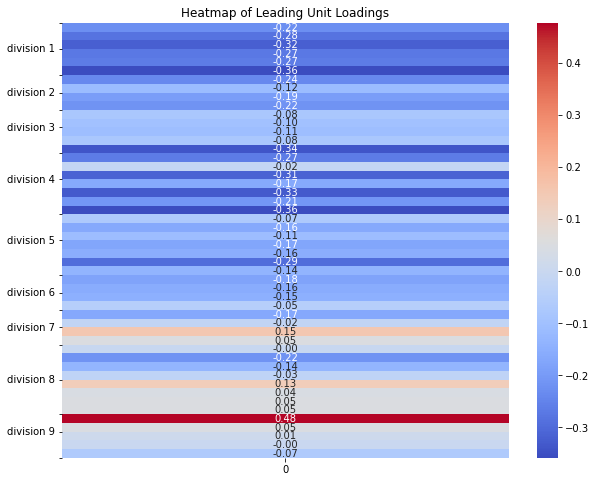

In [20]:
plt.figure(figsize=(10, 8)) 
sns.heatmap(ordered_loadings, annot=True, cmap='coolwarm', fmt=".2f", yticklabels=ordered_states) 
plt.title('Heatmap of Leading Unit Loadings') 
plt.yticks(ticks=[0, 3, 6, 8, 10, 12, 15, 18, 22, 25, 29, 31, 33, 35, 37, 41, 45, 47, 50], labels=['','division 1', '', 'division 2', '', 'division 3', '',
                                                          'division 4', '', 'division 5', '', 'division 6', '',
                                                          'division 7', '', 'division 8', '', 'division 9', ''])
plt.show()

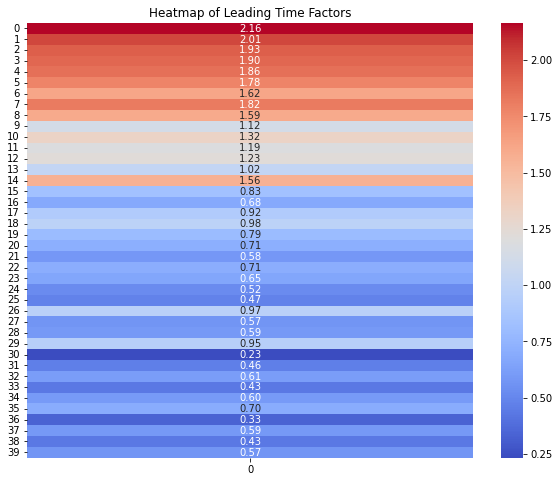

In [21]:
plt.figure(figsize=(10, 8)) 
sns.heatmap(time_factors.T, annot=True, cmap='coolwarm', fmt=".2f", yticklabels=np.arange(40)) 
plt.title('Heatmap of Leading Time Factors') 
plt.show()

## MSE on Test Samples

### TWFE

In [22]:
def TWFE(Y, M):
    units, times = Y.shape
    unit_effect = cp.Variable((1,units))
    time_effect = cp.Variable((1,times))
    unit_effects = cp.kron(np.ones((times,1)),unit_effect).T
    time_effects = cp.kron(np.ones((units,1)),time_effect)
    mu = cp.Variable()

    objective = cp.sum_squares(cp.multiply(Y-unit_effects-time_effects-mu,M))/np.sum(M)
    #objective = cp.sum_squares(cp.multiply(Y-unit_effects-time_effects,M))/np.sum(M)

    constraints = []

    prob = cp.Problem(cp.Minimize(objective),
                      constraints)
    prob.solve()
    
    return objective.value, unit_effect.value.T+time_effect.value+mu.value

In [23]:
_, predicted_values = TWFE(Y_true_full, mask)

In [24]:
np.sqrt(np.mean(np.square(Y_true_full[mask == 0]-predicted_values[mask == 0])))
#RMSE

0.13001274431507118

In [25]:
residuals = Y_true_full-predicted_values
U, S, VT = np.linalg.svd(residuals)
factor = np.outer(U[:, 0]*S[0],VT[0, :])

### TWFE Plus Unit Loading

In [43]:
def TWFE_plus_loading(Y, M, loading_factor):
    units, times = Y.shape
    unit_effect = cp.Variable((1,units))
    time_effect = cp.Variable((1,times))
    unit_effects = cp.kron(np.ones((times,1)),unit_effect).T
    time_effects = cp.kron(np.ones((units,1)),time_effect)
    loading_factor_coefficient = cp.Variable()
    mu = cp.Variable()

    #objective = cp.sum_squares(cp.multiply(Y-unit_effects-time_effects-mu-loading_factor_coefficient*loading_factor,M))/np.sum(M)
    objective = cp.sum_squares(cp.multiply(Y-unit_effects-time_effects-loading_factor_coefficient*loading_factor,M))/np.sum(M)
    constraints = []

    prob = cp.Problem(cp.Minimize(objective),
                      constraints)
    prob.solve()
    
    return objective.value, unit_effect.value.T+time_effect.value+loading_factor_coefficient.value*loading_factor

In [44]:
#_, _, predicted_values = TWFE_one_factor(Y_true_full, mask)
#_, predicted_values = TWFE_plus_loading(Y_true_full, mask, unit_loadings.dot(time_factors))
_, predicted_values = TWFE_plus_loading(Y_true_full, mask, factor)

In [45]:
np.sqrt(np.mean(np.square(Y_true_full[mask == 0]-predicted_values[mask == 0])))

0.10484644233495499

## Correlation with Treatment

In [46]:
model = LogisticRegression(penalty=None).fit(unit_loadings, assignment_vector)
pi = model.predict_proba(unit_loadings)[:,1]
model.coef_

array([[-3.90896028]])

In [47]:
unit_loadings_sm = sm.add_constant(unit_loadings)
logit_model = sm.Logit(assignment_vector, unit_loadings) 
result = logit_model.fit()
print(result.summary())

Optimization terminated successfully.
         Current function value: 0.640485
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                   50
Model:                          Logit   Df Residuals:                       49
Method:                           MLE   Df Model:                            0
Date:                Tue, 17 Dec 2024   Pseudo R-squ.:                 -0.4567
Time:                        18:39:08   Log-Likelihood:                -32.024
converged:                       True   LL-Null:                       -21.983
Covariance Type:            nonrobust   LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1             3.4981      1.623      2.156      0.031       0.318       6.679


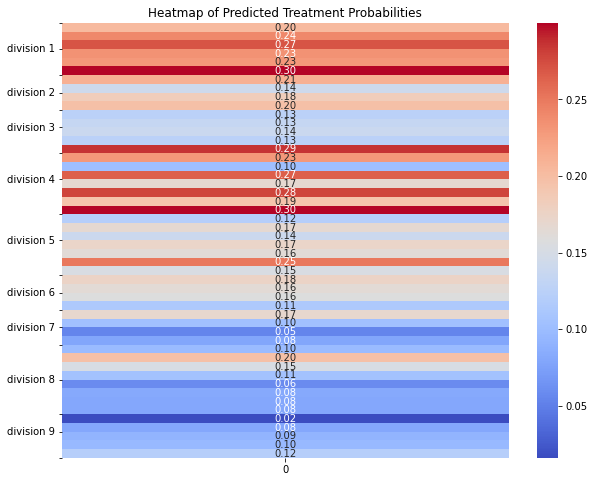

In [48]:
ordered_pi = np.array(pi[ordered_state_index])[:,np.newaxis]
plt.figure(figsize=(10, 8)) 
sns.heatmap(ordered_pi, annot=True, cmap='coolwarm', fmt=".2f", yticklabels=ordered_states) 
plt.title('Heatmap of Predicted Treatment Probabilities') 
#plt.yticks(ticks=[0, 5, 9], labels=['division 1','division 2', 'division 3'])
plt.yticks(ticks=[0, 3, 6, 8, 10, 12, 15, 18, 22, 25, 29, 31, 33, 35, 37, 41, 45, 47, 50], labels=['','division 1', '', 'division 2', '', 'division 3', '',
                                                          'division 4', '', 'division 5', '', 'division 6', '',
                                                          'division 7', '', 'division 8', '', 'division 9', ''])
plt.show()

## Unit Fixed Effects across Time

In [49]:
residuals = Y_true_full-np.mean(Y_true_full,axis=0)
indicator = np.zeros((T_total,))
indicator[20:] = 1
effects = []
stds = []
p_values = []
for i in range(N_total):
    model = sm.OLS(residuals[i,:], indicator).fit()
    print(model.summary())
    effects.append(model.params[0])
    stds.append(model.bse[0])
    p_values.append(model.pvalues[0])

                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.086
Model:                            OLS   Adj. R-squared (uncentered):              0.063
Method:                 Least Squares   F-statistic:                              3.680
Date:                Tue, 17 Dec 2024   Prob (F-statistic):                      0.0624
Time:                        18:39:11   Log-Likelihood:                         -35.645
No. Observations:                  40   AIC:                                      73.29
Df Residuals:                      39   BIC:                                      74.98
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

In [50]:
result = pd.DataFrame({'state': states, 'effct difference': effects, 'std': stds, 'p values': p_values})

In [51]:
result

,state,effct difference,std,p values
0,AK,0.256258,0.133585,6.241311e-02
1,AL,-0.150996,0.040907,6.809744e-04
2,AR,-0.236294,0.049481,2.536904e-05
3,AZ,0.074319,0.033125,3.061112e-02
4,CA,0.231960,0.070824,2.220110e-03
5,CO,0.229738,0.039112,7.752249e-07
6,CT,0.373815,0.066891,1.930645e-06
7,DE,0.239007,0.037372,1.463600e-07
8,FL,0.038430,0.016414,2.441892e-02
9,GA,0.039771,0.023139,9.357590e-02


In [52]:
result.round(4).to_csv('effect_difference.csv', index=False)

In [53]:
np.mean(result['p values']<0.05)

0.76

## WAGEPAN Dataset

In [54]:
#df_did = pd.read_stata('voting_cnty_clean.dta')
df_did = pd.read_stata('WAGEPAN.DTA')
pd.set_option('display.max_columns', None)

In [55]:
df_did

,nr,year,agric,black,bus,construc,ent,exper,fin,hisp,poorhlth,hours,manuf,married,min,nrthcen,nrtheast,occ1,occ2,occ3,occ4,occ5,occ6,occ7,occ8,occ9,per,pro,pub,rur,south,educ,tra,trad,union,lwage,d81,d82,d83,d84,d85,d86,d87,expersq
0,13,1980,0,0,1,0,0,1,0,0,0,2672,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,14,0,0,0,1.197540,0,0,0,0,0,0,0,1
1,13,1981,0,0,0,0,0,2,0,0,0,2320,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,14,0,0,1,1.853060,1,0,0,0,0,0,0,4
2,13,1982,0,0,1,0,0,3,0,0,0,2940,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,14,0,0,0,1.344462,0,1,0,0,0,0,0,9
3,13,1983,0,0,1,0,0,4,0,0,0,2960,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,14,0,0,0,1.433213,0,0,1,0,0,0,0,16
4,13,1984,0,0,0,0,0,5,0,0,0,3071,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,14,0,0,0,1.568125,0,0,0,1,0,0,0,25
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4355,12548,1983,0,0,0,1,0,8,0,0,0,2080,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,9,0,0,0,1.591879,0,0,1,0,0,0,0,64
4356,12548,1984,0,0,0,1,0,9,0,0,0,2080,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,9,0,0,1,1.212543,0,0,0,1,0,0,0,81
4357,12548,1985,0,0,0,1,0,10,0,0,0,2080,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,9,0,0,0,1.765962,0,0,0,0,1,0,0,100
4358,12548,1986,0,0,0,0,0,11,0,0,0,2080,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,1,9,0,0,1,1.745894,0,0,0,0,0,1,0,121


In [56]:
df_did.columns

Index(['nr', 'year', 'agric', 'black', 'bus', 'construc', 'ent', 'exper',
       'fin', 'hisp', 'poorhlth', 'hours', 'manuf', 'married', 'min',
       'nrthcen', 'nrtheast', 'occ1', 'occ2', 'occ3', 'occ4', 'occ5', 'occ6',
       'occ7', 'occ8', 'occ9', 'per', 'pro', 'pub', 'rur', 'south', 'educ',
       'tra', 'trad', 'union', 'lwage', 'd81', 'd82', 'd83', 'd84', 'd85',
       'd86', 'd87', 'expersq'],
      dtype='object')

In [57]:
df_did['nr'].nunique()

545

In [58]:
Y_true_full = np.reshape(df_did['lwage'].values, (545,-1))
Y_true_full /= np.std(Y_true_full)
Y_true_full -= np.mean(Y_true_full)
N_total,T_total = Y_true_full.shape

In [59]:
Y_true_full

array([[-0.84801126,  0.38290024, -0.57212734, ...,  0.09528494,
        -4.449192  ,  0.03763175],
       [ 0.05035281, -0.24551582, -0.16891742, ..., -0.07616019,
        -0.14414048,  0.3214481 ],
       [-0.25008893,  0.16192317, -0.03267956, ...,  1.1595476 ,
         0.7901571 ,  2.2984087 ],
       ...,
       [-1.2707664 , -0.6088865 , -1.2889725 , ...,  0.7292397 ,
        -0.9406216 , -0.6429596 ],
       [ 0.3584547 ,  0.9869616 ,  0.8893459 , ...,  1.0490077 ,
         1.3759048 ,  1.302736  ],
       [-0.9738116 , -0.63382745, -1.5335052 , ...,  0.21935034,
         0.18166804, -0.34288788]], dtype=float32)

In [60]:
W_true_full = np.reshape(df_did['union'].values, (545,-1))
W_true_full

array([[0, 1, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 1, 1]], dtype=int8)

In [61]:
np.random.seed(0)
mask = np.random.binomial(1, 0.5, size=(Y_true_full.shape))

In [62]:
def TWFE_treatment(Y, M, W, loading_factor):
    units, times = Y.shape
    unit_effect = cp.Variable((1,units))
    time_effect = cp.Variable((1,times))
    unit_effects = cp.kron(np.ones((times,1)),unit_effect).T
    time_effects = cp.kron(np.ones((units,1)),time_effect)
    loading_factor_coefficient = cp.Variable()
    tau = cp.Variable()

    #objective = cp.sum_squares(cp.multiply(Y-unit_effects-time_effects-mu-loading_factor_coefficient*loading_factor,M))/np.sum(M)
    objective = cp.sum_squares(cp.multiply(Y-unit_effects-time_effects-W*tau-loading_factor_coefficient*loading_factor,M))/np.sum(M)
    constraints = []

    prob = cp.Problem(cp.Minimize(objective),
                      constraints)
    prob.solve()
    
    return objective.value, unit_effect.value.T+time_effect.value+loading_factor_coefficient.value*loading_factor+W*tau.value

## MSE on Test Samples

### TWFE

In [63]:
#_, predicted_values = TWFE_treatment(Y_true_full, mask, W_true_full, np.zeros(Y_true_full.shape))
_, predicted_values = TWFE(Y_true_full, mask)

In [64]:
np.sqrt(np.mean(np.square(Y_true_full[mask == 0]-predicted_values[mask == 0])))

0.8002016513625726

In [65]:
residuals = Y_true_full-predicted_values
U, S, VT = np.linalg.svd(residuals)
factor = np.outer(U[:, 0]*S[0],VT[0, :])

### TWFE Plus Unit Loading

In [66]:
#_, _, predicted_values = TWFE_one_factor(Y_true_full, mask)
#_, predicted_values = TWFE_treatment(Y_true_full, mask, W_true_full, factor)
_, predicted_values = TWFE_plus_loading(Y_true_full, mask, factor)

In [67]:
np.sqrt(np.mean(np.square(Y_true_full[mask == 0]-predicted_values[mask == 0])))

0.6687475350391858

### Correlation with treatments

In [70]:
treatments = W_true_full.reshape(-1)
lfs = factor.reshape(-1)
lfs = sm.add_constant(lfs)
logit_model = sm.Logit(treatments, lfs) 
result = logit_model.fit()
print(result.summary())

Optimization terminated successfully.
         Current function value: 0.555497
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:                      y   No. Observations:                 4360
Model:                          Logit   Df Residuals:                     4358
Method:                           MLE   Df Model:                            1
Date:                Tue, 17 Dec 2024   Pseudo R-squ.:               0.0003439
Time:                        18:40:12   Log-Likelihood:                -2422.0
converged:                       True   LL-Null:                       -2422.8
Covariance Type:            nonrobust   LLR p-value:                    0.1967
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.1315      0.035    -32.070      0.000      -1.201      -1.062
x1             0.1334      0.

## Unit Fixed Effects across Time

In [71]:
residuals = Y_true_full-np.mean(Y_true_full,axis=0)
indicator = np.zeros((T_total,))
indicator[4:] = 1
effects = []
stds = []
p_values = []
for i in range(N_total):
    model = sm.OLS(residuals[i,:], indicator).fit()
    print(model.summary())
    effects.append(model.params[0])
    stds.append(model.bse[0])
    p_values.append(model.pvalues[0])

/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:180

                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.312
Model:                            OLS   Adj. R-squared (uncentered):              0.213
Method:                 Least Squares   F-statistic:                              3.171
Date:                Tue, 17 Dec 2024   Prob (F-statistic):                       0.118
Time:                        18:40:13   Log-Likelihood:                         -14.156
No. Observations:                   8   AIC:                                      30.31
Df Residuals:                       7   BIC:                                      30.39
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:180

                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.029
Model:                            OLS   Adj. R-squared (uncentered):             -0.110
Method:                 Least Squares   F-statistic:                             0.2100
Date:                Tue, 17 Dec 2024   Prob (F-statistic):                       0.661
Time:                        18:40:13   Log-Likelihood:                         -3.4916
No. Observations:                   8   AIC:                                      8.983
Df Residuals:                       7   BIC:                                      9.063
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:180

                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.747
Model:                            OLS   Adj. R-squared (uncentered):              0.711
Method:                 Least Squares   F-statistic:                              20.65
Date:                Tue, 17 Dec 2024   Prob (F-statistic):                     0.00266
Time:                        18:40:13   Log-Likelihood:                          1.2056
No. Observations:                   8   AIC:                                    -0.4113
Df Residuals:                       7   BIC:                                    -0.3318
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:180

                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.738
Model:                            OLS   Adj. R-squared (uncentered):              0.700
Method:                 Least Squares   F-statistic:                              19.67
Date:                Tue, 17 Dec 2024   Prob (F-statistic):                     0.00303
Time:                        18:40:13   Log-Likelihood:                        -0.31516
No. Observations:                   8   AIC:                                      2.630
Df Residuals:                       7   BIC:                                      2.710
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:180

                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.840
Model:                            OLS   Adj. R-squared (uncentered):              0.817
Method:                 Least Squares   F-statistic:                              36.64
Date:                Tue, 17 Dec 2024   Prob (F-statistic):                    0.000514
Time:                        18:40:14   Log-Likelihood:                         -3.3422
No. Observations:                   8   AIC:                                      8.684
Df Residuals:                       7   BIC:                                      8.764
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:180

                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.335
Model:                            OLS   Adj. R-squared (uncentered):              0.241
Method:                 Least Squares   F-statistic:                              3.534
Date:                Tue, 17 Dec 2024   Prob (F-statistic):                       0.102
Time:                        18:40:14   Log-Likelihood:                         -17.123
No. Observations:                   8   AIC:                                      36.25
Df Residuals:                       7   BIC:                                      36.33
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:180


                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.279
Model:                            OLS   Adj. R-squared (uncentered):              0.176
Method:                 Least Squares   F-statistic:                              2.703
Date:                Tue, 17 Dec 2024   Prob (F-statistic):                       0.144
Time:                        18:40:14   Log-Likelihood:                         -10.208
No. Observations:                   8   AIC:                                      22.42
Df Residuals:                       7   BIC:                                      22.50
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------

/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:180


                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.672
Model:                            OLS   Adj. R-squared (uncentered):              0.626
Method:                 Least Squares   F-statistic:                              14.37
Date:                Tue, 17 Dec 2024   Prob (F-statistic):                     0.00679
Time:                        18:40:14   Log-Likelihood:                         -5.6144
No. Observations:                   8   AIC:                                      13.23
Df Residuals:                       7   BIC:                                      13.31
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------

/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:180

                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.586
Model:                            OLS   Adj. R-squared (uncentered):              0.527
Method:                 Least Squares   F-statistic:                              9.900
Date:                Tue, 17 Dec 2024   Prob (F-statistic):                      0.0162
Time:                        18:40:14   Log-Likelihood:                         -5.6031
No. Observations:                   8   AIC:                                      13.21
Df Residuals:                       7   BIC:                                      13.29
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:180

                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.302
Model:                            OLS   Adj. R-squared (uncentered):              0.202
Method:                 Least Squares   F-statistic:                              3.022
Date:                Tue, 17 Dec 2024   Prob (F-statistic):                       0.126
Time:                        18:40:15   Log-Likelihood:                         -4.8158
No. Observations:                   8   AIC:                                      11.63
Df Residuals:                       7   BIC:                                      11.71
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:180

                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.652
Model:                            OLS   Adj. R-squared (uncentered):              0.602
Method:                 Least Squares   F-statistic:                              13.10
Date:                Tue, 17 Dec 2024   Prob (F-statistic):                     0.00851
Time:                        18:40:15   Log-Likelihood:                         -7.3395
No. Observations:                   8   AIC:                                      16.68
Df Residuals:                       7   BIC:                                      16.76
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:180

                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.137
Model:                            OLS   Adj. R-squared (uncentered):              0.014
Method:                 Least Squares   F-statistic:                              1.114
Date:                Tue, 17 Dec 2024   Prob (F-statistic):                       0.326
Time:                        18:40:15   Log-Likelihood:                         -6.9176
No. Observations:                   8   AIC:                                      15.84
Df Residuals:                       7   BIC:                                      15.91
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:180

                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.001
Model:                            OLS   Adj. R-squared (uncentered):             -0.142
Method:                 Least Squares   F-statistic:                           0.004512
Date:                Tue, 17 Dec 2024   Prob (F-statistic):                       0.948
Time:                        18:40:15   Log-Likelihood:                         -14.263
No. Observations:                   8   AIC:                                      30.53
Df Residuals:                       7   BIC:                                      30.61
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:180

                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.404
Model:                            OLS   Adj. R-squared (uncentered):              0.319
Method:                 Least Squares   F-statistic:                              4.748
Date:                Tue, 17 Dec 2024   Prob (F-statistic):                      0.0657
Time:                        18:40:15   Log-Likelihood:                         -10.748
No. Observations:                   8   AIC:                                      23.50
Df Residuals:                       7   BIC:                                      23.58
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:180


                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.615
Model:                            OLS   Adj. R-squared (uncentered):              0.560
Method:                 Least Squares   F-statistic:                              11.18
Date:                Tue, 17 Dec 2024   Prob (F-statistic):                      0.0124
Time:                        18:40:16   Log-Likelihood:                         -4.5398
No. Observations:                   8   AIC:                                      11.08
Df Residuals:                       7   BIC:                                      11.16
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------

/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:180

                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.019
Model:                            OLS   Adj. R-squared (uncentered):             -0.121
Method:                 Least Squares   F-statistic:                             0.1361
Date:                Tue, 17 Dec 2024   Prob (F-statistic):                       0.723
Time:                        18:40:16   Log-Likelihood:                         -8.5166
No. Observations:                   8   AIC:                                      19.03
Df Residuals:                       7   BIC:                                      19.11
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:180

                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.000
Model:                            OLS   Adj. R-squared (uncentered):             -0.143
Method:                 Least Squares   F-statistic:                           0.001033
Date:                Tue, 17 Dec 2024   Prob (F-statistic):                       0.975
Time:                        18:40:16   Log-Likelihood:                         -8.9188
No. Observations:                   8   AIC:                                      19.84
Df Residuals:                       7   BIC:                                      19.92
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:180


                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.467
Model:                            OLS   Adj. R-squared (uncentered):              0.391
Method:                 Least Squares   F-statistic:                              6.126
Date:                Tue, 17 Dec 2024   Prob (F-statistic):                      0.0425
Time:                        18:40:16   Log-Likelihood:                         -2.9276
No. Observations:                   8   AIC:                                      7.855
Df Residuals:                       7   BIC:                                      7.935
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------

/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:180


                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.246
Model:                            OLS   Adj. R-squared (uncentered):              0.138
Method:                 Least Squares   F-statistic:                              2.279
Date:                Tue, 17 Dec 2024   Prob (F-statistic):                       0.175
Time:                        18:40:17   Log-Likelihood:                         -8.4197
No. Observations:                   8   AIC:                                      18.84
Df Residuals:                       7   BIC:                                      18.92
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------

/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:180


                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.371
Model:                            OLS   Adj. R-squared (uncentered):              0.281
Method:                 Least Squares   F-statistic:                              4.126
Date:                Tue, 17 Dec 2024   Prob (F-statistic):                      0.0818
Time:                        18:40:17   Log-Likelihood:                         -9.1869
No. Observations:                   8   AIC:                                      20.37
Df Residuals:                       7   BIC:                                      20.45
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------

/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:180


                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.766
Model:                            OLS   Adj. R-squared (uncentered):              0.733
Method:                 Least Squares   F-statistic:                              22.95
Date:                Tue, 17 Dec 2024   Prob (F-statistic):                     0.00199
Time:                        18:40:17   Log-Likelihood:                         -5.6507
No. Observations:                   8   AIC:                                      13.30
Df Residuals:                       7   BIC:                                      13.38
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------

/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:180


                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.727
Model:                            OLS   Adj. R-squared (uncentered):              0.688
Method:                 Least Squares   F-statistic:                              18.65
Date:                Tue, 17 Dec 2024   Prob (F-statistic):                     0.00349
Time:                        18:40:17   Log-Likelihood:                         -11.318
No. Observations:                   8   AIC:                                      24.64
Df Residuals:                       7   BIC:                                      24.72
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------

/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:180


                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.001
Model:                            OLS   Adj. R-squared (uncentered):             -0.142
Method:                 Least Squares   F-statistic:                           0.005653
Date:                Tue, 17 Dec 2024   Prob (F-statistic):                       0.942
Time:                        18:40:17   Log-Likelihood:                         0.20079
No. Observations:                   8   AIC:                                      1.598
Df Residuals:                       7   BIC:                                      1.678
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------

/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:180


                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.586
Model:                            OLS   Adj. R-squared (uncentered):              0.527
Method:                 Least Squares   F-statistic:                              9.922
Date:                Tue, 17 Dec 2024   Prob (F-statistic):                      0.0162
Time:                        18:40:18   Log-Likelihood:                         0.74771
No. Observations:                   8   AIC:                                     0.5046
Df Residuals:                       7   BIC:                                     0.5840
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------

/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:1806: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/users/zhaonanq/.local/lib/python3.9/site-packages/scipy/stats/_stats_py.py:180

In [72]:
result = pd.DataFrame({'nr': df_did['nr'].unique(), 'effct difference': effects, 'std': stds, 'p values': p_values})

In [73]:
pd.set_option('display.max_rows', None)
result

,nr,effct difference,std,p values
0,13,-1.351503,0.758942,0.118162
1,17,-0.221845,0.118232,0.102714
2,18,1.078718,0.250892,0.003569
3,45,0.241161,0.204709,0.277262
4,110,0.595384,0.362906,0.144886
5,120,0.003770,0.447802,0.993518
6,126,0.509081,0.345452,0.184063
7,150,-1.530488,0.293684,0.001238
8,162,0.181598,0.394996,0.659637
9,166,-0.298827,0.309172,0.365973


In [74]:
result.round(4).to_csv('effect_difference_WAGEPAN.csv', index=False)

In [75]:
np.mean(result['p values']<0.05)

0.3614678899082569

## PENN Data

In [76]:
df = pd.read_csv('PENN.csv',sep=';')
Y_true_full = np.reshape(df['log_gdp'].values, (48,-1))
Y_true_full = Y_true_full.T
Y_true_full /= np.std(Y_true_full)
Y_true_full -= np.mean(Y_true_full)
N_total,T_total = Y_true_full.shape

democracy = np.reshape(df['dem'].values, (48,-1))
democracy = democracy.T
df

,country,year,log_gdp,dem,educ
0,Argentina,1960,0.459565,False,False
1,Australia,1960,0.945638,False,False
2,Austria,1960,0.637185,False,False
3,Burundi,1960,-1.749135,False,False
4,Belgium,1960,0.627998,False,False
5,Benin,1960,-1.360871,False,False
6,Burkina Faso,1960,-1.737116,False,False
7,Bangladesh,1960,-1.118826,False,False
8,Bolivia (Plurinational State of),1960,-0.352500,False,False
9,Brazil,1960,-0.251006,False,False


In [77]:
Y_true_full

array([[ 0.45956458,  0.47298454,  0.46506122, ...,  0.77319728,
         0.82957345,  0.89354427],
       [ 0.94563819,  0.93794953,  0.9738106 , ...,  1.75882824,
         1.77625286,  1.79138443],
       [ 0.63718524,  0.67555933,  0.68700114, ...,  1.67223843,
         1.69768914,  1.72578502],
       ...,
       [ 0.24590107,  0.25456422,  0.28388819, ...,  0.56562785,
         0.6022413 ,  0.6373743 ],
       [-0.58751627, -0.600719  , -0.61821316, ..., -0.6959263 ,
        -0.65467008, -0.61005742],
       [-1.31389098, -1.29061389, -1.30024676, ..., -1.42821256,
        -1.47123725, -1.51233664]])

In [78]:
np.random.seed(0)
mask = np.random.binomial(1, 0.5, size=(Y_true_full.shape))

## MSE on Test Samples

### TWFE

In [79]:
#_, predicted_values = TWFE_treatment(Y_true_full, mask, W_true_full, np.zeros(Y_true_full.shape))
_, predicted_values = TWFE(Y_true_full, mask)

In [80]:
np.sqrt(np.mean(np.square(Y_true_full[mask == 0]-predicted_values[mask == 0])))

0.2462177104882635

In [81]:
residuals = Y_true_full-predicted_values
U, S, VT = np.linalg.svd(residuals)
factor = np.outer(U[:, 0]*S[0],VT[0, :])

### TWFE Plus Unit Loading

In [82]:
#_, _, predicted_values = TWFE_one_factor(Y_true_full, mask)
#_, predicted_values = TWFE_treatment(Y_true_full, mask, W_true_full, factor)
_, predicted_values = TWFE_plus_loading(Y_true_full, mask, factor)

In [83]:
np.sqrt(np.mean(np.square(Y_true_full[mask == 0]-predicted_values[mask == 0])))

0.10512561789611187

## Unit Fixed Effects across Time

In [84]:
residuals = Y_true_full-np.mean(Y_true_full,axis=0)
indicator = np.zeros((T_total,))
indicator[24:] = 1
effects = []
stds = []
p_values = []
for i in range(N_total):
    model = sm.OLS(residuals[i,:], indicator).fit()
    print(model.summary())
    effects.append(model.params[0])
    stds.append(model.bse[0])
    p_values.append(model.pvalues[0])

                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.303
Model:                            OLS   Adj. R-squared (uncentered):              0.288
Method:                 Least Squares   F-statistic:                              20.43
Date:                Tue, 17 Dec 2024   Prob (F-statistic):                    4.18e-05
Time:                        18:40:31   Log-Likelihood:                         -39.295
No. Observations:                  48   AIC:                                      80.59
Df Residuals:                      47   BIC:                                      82.46
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

In [85]:
result = pd.DataFrame({'country': df['country'].unique(), 'effct difference': effects, 'std': stds, 'p values': p_values})

In [86]:
pd.set_option('display.max_rows', None)
result

,country,effct difference,std,p values
0,Argentina,0.511510,0.113179,4.181439e-05
1,Australia,1.416085,0.197569,4.555074e-09
2,Austria,1.352168,0.170414,3.189712e-10
3,Burundi,-1.687552,0.213929,3.740078e-10
4,Belgium,1.305372,0.170017,7.736187e-10
5,Benin,-1.183072,0.161020,2.435234e-09
6,Burkina Faso,-1.663004,0.227436,2.754527e-09
7,Bangladesh,-1.200502,0.156308,7.669590e-10
8,Bolivia (Plurinational State of),-0.434403,0.022098,2.595596e-24
9,Brazil,0.454674,0.058953,6.862429e-10


In [87]:
result.round(4).to_csv('effect_difference_PENN.csv', index=False)

In [88]:
np.mean(result['p values']<0.05)

0.9099099099099099

## County Voting Data

In [89]:
df_did = pd.read_stata('voting_cnty_clean.dta')
pd.set_option('display.max_rows', 50)

In [90]:
df_did

,cnty90,year,preseligible,prestout,congtout,state,pmsa90,border_changes,st,nummarkets,ishare_urb,D_ishare_foreign,D_ishare_manuf,D_ishare_male,D_ishare_urb,D_ishare_town,D_ishare_white,D_ilog_manufoutputpercap,numdailies,circ,miss_circ,num_polaff_R,num_polaff_D,num_polaff_I,num_polaff_none,num_nonpol,numdailies_y4,num_polaff_R_y4,num_polaff_D_y4,entry_conf,entry_polaff_R,entry_polaff_D,readshare_hhld,redistricted,inc_unkwn_h,inc_run_unkwn_h,num_always_R,num_always_D,D_ishare_lit,circ_elig,D_lcirc_continue,circrepshare,lpreseligible,lpresttlvote,styr,num_changes,mainsample,mainsample_circ,mainsample_time,mainsample_time_circ,samplemean_preseligible,samplemean_numdailies,samplemean_outputpercap,samplemean_ishare_foreign,samplemean_ishare_manuf,samplemean_ishare_male,samplemean_ishare_urb,samplemean_ishare_town,samplemean_ishare_white,newspaper,radio,tv,D_ilog_manufout_ctrl,mis_D_ishare_foreign,mis_D_ishare_manuf,mis_D_ishare_male,mis_D_ishare_urb,mis_D_ishare_town,mis_D_ishare_white,mis_D_ilog_manufout_ctrl,mis_D_ishare_lit,numcomp,D_prestout_state,presrepshare,presevenness,congrepshare,congshare,D_congtout_long,govrepshare,govtout,govshare,senrepshare,sentout,state_presevenness,multi,inc_cand_h_index,mainsample_inc,mainsample_time_inc,congshare_inccand,mainsample_inc_gov,govshare_inccand
0,1001,1824,NaN,NaN,NaN,AL,5240.0,0.0,1,0,0.0,-1.0,-1.0,-1.0,0.0,0.0,-0.045196,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,1.0,NaN,NaN,0,0,-1.0,NaN,NaN,0.0,NaN,6.278522,1,0,0,0,0,0,NaN,NaN,1623.335205,NaN,NaN,NaN,NaN,NaN,NaN,1,0,0,-1.0,1,1,1,0,0,0,1,1,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,0.0,0.0,NaN,0.0,NaN
1,1001,1828,NaN,NaN,NaN,AL,5240.0,0.0,1,0,0.0,-1.0,-1.0,-1.0,0.0,0.0,-0.021699,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,NaN,NaN,0,0,-1.0,NaN,NaN,0.0,NaN,6.464588,2,0,0,0,0,0,NaN,NaN,1623.335205,NaN,NaN,NaN,NaN,NaN,NaN,1,0,0,-1.0,1,1,1,0,0,0,1,1,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,0.0,0.0,NaN,0.0,NaN
2,1001,1832,NaN,NaN,NaN,AL,5240.0,0.0,1,0,0.0,-1.0,-1.0,-1.0,0.0,0.0,-0.022904,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,1.0,NaN,NaN,0,0,-1.0,NaN,NaN,0.0,NaN,NaN,3,0,0,0,0,0,NaN,NaN,1623.335205,NaN,NaN,NaN,NaN,NaN,NaN,1,0,0,-1.0,1,1,1,0,0,0,1,1,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,0.0,0.0,NaN,0.0,NaN
3,1001,1836,NaN,NaN,NaN,AL,5240.0,0.0,1,0,0.0,-1.0,-1.0,-1.0,0.0,0.0,-0.025939,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,1.0,NaN,NaN,0,0,-1.0,NaN,NaN,0.0,NaN,7.068172,4,0,0,0,0,0,NaN,NaN,1623.335205,NaN,NaN,NaN,NaN,NaN,NaN,1,0,0,-1.0,1,1,1,0,0,0,1,1,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,0.0,0.0,NaN,0.0,NaN
4,1001,1840,1348.379639,0.864000,NaN,AL,5240.0,0.0,1,0,0.0,-1.0,-1.0,-1.0,0.0,0.0,-0.022542,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,NaN,NaN,0,0,-1.0,0.0,NaN,0.0,7.206659,7.060476,5,0,0,0,0,0,NaN,NaN,1623.335205,NaN,NaN,NaN,NaN,NaN,NaN,1,0,0,-1.0,1,1,1,0,0,0,1,1,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,0.0,0.0,NaN,0.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
143239,56045,1988,4635.200195,0.587677,0.592207,WY,NaN,0.0,56,1,NaN,-1.0,-1.0,-1.0,-1.0,-1.0,-1.000000,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,NaN,0.0,0.0,0,0,-1.0,0.0,NaN,0.0,8.441435,7.909857,2296,0,0,0,1,1,NaN,NaN,174.864883,NaN,NaN,NaN,NaN,NaN,NaN,0,0,1,-1.0,1,1,1,1,1,1,1,1,0,NaN,0.739859,0.760141,0.801842,1.007709,-0.01642,NaN,NaN,NaN,0.636331,0.604505,0.885751,0,1.0,0.0,0.0,0.801842,0.0,NaN
143240,56045,1992,4676.399902,0.647293,NaN,WY,NaN,0.0,56,1,NaN,-1.0,-1.0,-1.0,-1.0,-1.0,-1.000000,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,NaN,NaN,NaN,0,0,-1.0,0.0,NaN,0.0,8.450284,8.015327,2297,0,0,0,1,1,NaN,NaN,174.864883,NaN,NaN,NaN,NaN,NaN,NaN,0,0,1,-1.0,1,1,1,1,1,1,1,1,0,NaN,0.668339,0.831661,NaN,NaN,NaN,NaN,NaN,N

In [91]:
df_did['cnty90'].unique().shape

(3114,)

In [92]:
Y_true_full = np.reshape(df_did['prestout'].values.T, (3114,-1))

In [93]:
Y_true_full

array([[       nan,        nan,        nan, ..., 0.5438631 ,        nan,
               nan],
       [       nan,        nan,        nan, ..., 0.50795037,        nan,
               nan],
       [       nan,        nan,        nan, ..., 0.44381103,        nan,
               nan],
       ...,
       [       nan,        nan,        nan, ..., 0.5812062 ,        nan,
               nan],
       [       nan,        nan,        nan, ..., 0.66409916,        nan,
               nan],
       [       nan,        nan,        nan, ..., 0.6526567 ,        nan,
               nan]], dtype=float32)

In [94]:
Y_true_full = Y_true_full[:,11:43]

In [95]:
df = pd.DataFrame(Y_true_full)
pd.set_option('display.max_rows', None)

In [96]:
df = df.dropna(axis=0)
df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31
0,1.072000,0.939,0.942,0.744,0.670,0.524,0.667000,0.495000,0.406,0.195,0.166,0.183,0.196,0.126000,0.103000,0.165,0.149,0.156,0.160,0.131,0.245000,0.236,0.226,0.254,0.305,0.609,0.467000,0.502065,0.516046,0.529353,0.494387,0.610344
1,0.879000,0.786,0.780,0.685,0.712,0.617,0.602000,0.423000,0.280,0.155,0.139,0.184,0.217,0.192000,0.168000,0.202,0.186,0.182,0.199,0.140,0.281000,0.286,0.337,0.396,0.449,0.569,0.467000,0.483020,0.521598,0.535457,0.515396,0.585200
2,1.016000,0.849,0.586,0.580,0.428,0.623,0.864000,0.654000,0.426,0.204,0.200,0.182,0.186,0.122000,0.098000,0.155,0.145,0.151,0.145,0.146,0.224000,0.207,0.248,0.254,0.369,0.612,0.494000,0.554520,0.539499,0.591044,0.502848,0.558016
3,0.807000,0.776,0.694,0.434,0.363,0.538,0.669000,0.545000,0.275,0.253,0.162,0.194,0.273,0.203000,0.132000,0.214,0.177,0.201,0.194,0.155,0.262000,0.303,0.306,0.353,0.398,0.576,0.487000,0.454619,0.527783,0.512084,0.445264,0.536219
4,0.398000,0.410,0.684,0.517,0.534,0.529,0.716000,1.078000,0.577,0.503,0.449,0.466,0.519,0.637000,0.315000,0.268,0.215,0.250,0.242,0.204,0.276000,0.314,0.391,0.405,0.444,0.553,0.452000,0.488076,0.496449,0.461224,0.475442,0.533100
6,0.897000,0.833,0.841,0.738,0.696,0.776,0.726000,0.558000,0.370,0.164,0.145,0.167,0.191,0.107000,0.090000,0.135,0.158,0.155,0.167,0.123,0.173000,0.235,0.250,0.313,0.381,0.566,0.450000,0.497433,0.563729,0.579565,0.490480,0.551573
7,0.647000,0.737,0.682,0.596,0.535,0.490,0.623000,0.534000,0.338,0.227,0.234,0.240,0.250,0.195000,0.110000,0.169,0.171,0.150,0.144,0.128,0.170000,0.237,0.275,0.271,0.299,0.456,0.374000,0.415765,0.414835,0.441646,0.391451,0.493064
8,0.810000,0.876,0.817,0.615,0.606,0.730,0.751000,0.511000,0.559,0.215,0.143,0.200,0.215,0.124000,0.112000,0.145,0.147,0.174,0.184,0.159,0.143000,0.317,0.302,0.325,0.327,0.483,0.467000,0.457011,0.435175,0.493089,0.475209,0.479394
9,0.492000,0.613,0.600,0.387,0.442,0.486,0.732000,0.557000,0.604,0.367,0.306,0.377,0.359,0.391000,0.246000,0.259,0.239,0.252,0.292,0.220,0.242000,0.338,0.373,0.426,0.402,0.589,0.412000,0.511437,0.480484,0.452009,0.419007,0.504251
11,0.877000,0.680,0.660,0.728,0.414,0.609,0.608000,0.539000,0.306,0.169,0.174,0.141,0.182,0.124000,0.108000,0.168,0.157,0.156,0.206,0.133,0.295000,0.227,0.190,0.195,0.317,0.666,0.493000,0.656349,0.596555,0.659576,0.633641,0.662763


In [97]:
df.values

array([[1.072     , 0.93900007, 0.942     , ..., 0.5293527 , 0.49438667,
        0.6103435 ],
       [0.879     , 0.786     , 0.78      , ..., 0.5354573 , 0.5153961 ,
        0.5852    ],
       [1.016     , 0.84900004, 0.58599997, ..., 0.5910445 , 0.5028476 ,
        0.55801636],
       ...,
       [0.813     , 0.755     , 0.8809999 , ..., 0.6215275 , 0.5966875 ,
        0.67911947],
       [0.84900004, 0.738     , 0.9       , ..., 0.6202422 , 0.61320066,
        0.70934767],
       [0.7980001 , 0.818     , 0.78300005, ..., 0.6397699 , 0.62565935,
        0.678672  ]], dtype=float32)

In [98]:
Y_true_full = df.values
Y_true_full /= np.std(Y_true_full)
Y_true_full -= np.mean(Y_true_full)
N_total,T_total = Y_true_full.shape

In [99]:
Y_true_full

array([[ 2.0570645 ,  1.440908  ,  1.4548059 , ..., -0.45688868,
        -0.6188779 , -0.08167791],
       [ 1.1629424 ,  0.73209596,  0.7042992 , ..., -0.42860746,
        -0.5215461 , -0.1981616 ],
       [ 1.7976303 ,  1.0239596 , -0.19445562, ..., -0.1710856 ,
        -0.57968044, -0.32409692],
       ...,
       [ 0.85718036,  0.5884805 ,  1.1722074 , ..., -0.02986526,
        -0.144943  ,  0.23694444],
       [ 1.0239596 ,  0.5097234 ,  1.2602301 , ..., -0.03581977,
        -0.06844139,  0.37698412],
       [ 0.78768945,  0.88034415,  0.7181978 , ...,  0.05464745,
        -0.01072335,  0.23487139]], dtype=float32)

In [100]:
np.random.seed(0)
mask = np.random.binomial(1, 0.5, size=(Y_true_full.shape))

## MSE on Test Samples

### TWFE

In [101]:
#_, predicted_values = TWFE_treatment(Y_true_full, mask, W_true_full, np.zeros(Y_true_full.shape))
_, predicted_values = TWFE(Y_true_full, mask)

In [102]:
np.sqrt(np.mean(np.square(Y_true_full[mask == 0]-predicted_values[mask == 0])))

0.6116158456973235

In [103]:
residuals = Y_true_full-predicted_values
U, S, VT = np.linalg.svd(residuals)
factor = np.outer(U[:, 0]*S[0],VT[0, :])

### TWFE Plus Unit Loading

In [104]:
#_, _, predicted_values = TWFE_one_factor(Y_true_full, mask)
#_, predicted_values = TWFE_treatment(Y_true_full, mask, W_true_full, factor)
_, predicted_values = TWFE_plus_loading(Y_true_full, mask, factor)

In [105]:
np.sqrt(np.mean(np.square(Y_true_full[mask == 0]-predicted_values[mask == 0])))

0.46727121044529324

## Unit Fixed Effects across Time

In [106]:
residuals = Y_true_full-np.mean(Y_true_full,axis=0)
indicator = np.zeros((T_total,))
indicator[16:] = 1
effects = []
stds = []
p_values = []
for i in range(N_total):
    model = sm.OLS(residuals[i,:], indicator).fit()
    print(model.summary())
    effects.append(model.params[0])
    stds.append(model.bse[0])
    p_values.append(model.pvalues[0])

                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.289
Model:                            OLS   Adj. R-squared (uncentered):              0.266
Method:                 Least Squares   F-statistic:                              12.57
Date:                Tue, 17 Dec 2024   Prob (F-statistic):                     0.00127
Time:                        18:41:04   Log-Likelihood:                         -52.017
No. Observations:                  32   AIC:                                      106.0
Df Residuals:                      31   BIC:                                      107.5
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

In [107]:
result = pd.DataFrame({'effct difference': effects, 'std': stds, 'p values': p_values})

In [108]:
pd.set_option('display.max_rows', None)
result

,effct difference,std,p values
0,-1.107410,0.312292,1.266250e-03
1,-0.950337,0.289661,2.562526e-03
2,-1.063765,0.311339,1.789762e-03
3,-1.021190,0.287671,1.253419e-03
4,-0.930758,0.193316,3.650673e-05
5,-1.088999,0.300942,1.040969e-03
6,-1.327012,0.266384,2.264184e-05
7,-1.171781,0.273405,1.640666e-04
8,-0.944686,0.216901,1.348442e-04
9,-0.918136,0.332826,9.650333e-03


In [109]:
result.round(4).to_csv('effect_difference_Voting.csv', index=False)

In [110]:
np.mean(result['p values']<0.05)

0.7550620509470934

# Older code

## NTV Data

In [550]:
# df_did = pd.read_stata('voting_cnty_clean.dta')
# pd.set_option('display.max_columns', None)
# df_did

In [551]:
df_did = pd.read_stata('NTV_Aggregate_Data.dta')
pd.set_option('display.max_columns', None)

In [552]:
df_did

,city_id,region,tik_id,population1996,doctors_pc1996,nurses1996,population1998,doctors_pc1998,nurses1998,logpop98,retired98,unempl98,pop_change98,farmers98,migr98,crime_rate98,pension98,wage98,wage98_ln,Gorod,NTV1997,NTV1999,Votes_KPRF_1999,Votes_Edinstvo_1999,Votes_OVR_1999,Votes_SPS_1999,Votes_LDPR_1999,Votes_Yabloko_1999,Votes_KPRF_1995,Votes_LDPR_1995,Votes_NDR_1995,Votes_Yabloko_1995,Votes_DVR_1995,Votes_SPS_2003,Votes_Yabloko_2003,Votes_LDPR_2003,Votes_Edinstvo_2003,Votes_KPRF_2003,Turnout_2003,Turnout1995,Turnout1999,tvmaxtvflosspowerA,tvmaxtveloss5050powerA,logpop96,wage96_ln,logpop97,wage97_ln,Watch_OLS,Watch_probit
0,385600.0,1.0,101,35.000000,15.100000,60.599998,35.299999,15.100000,67.800003,3.591818,30.283287,0.461756,-0.056657,0.009915,0.645892,160.000000,0.371000,0.54000,0.431782,0.0,0.0,0.0,38.201492,27.784571,4.560460,2.573664,6.180463,2.047928,34.750000,11.790000,2.870000,2.300000,0.850000,0.677294,1.032461,14.446189,35.714878,18.691666,47.354012,65.187660,52.665913,-23.143021,-40.977463,3.583519,6.094939,3.589059,6.202092,0.611752,0.620406
1,385400.0,1.0,102,31.599999,15.800001,66.600000,31.699999,15.100000,76.699997,3.487375,29.015774,0.362776,4.132492,0.010726,0.444795,86.000000,0.354000,0.46300,0.380489,0.0,0.0,0.0,35.611351,27.842180,12.521617,1.902261,2.978287,3.067956,43.900002,9.540000,2.870000,2.580000,0.570000,0.271363,0.702352,2.426306,76.194534,10.327764,82.994041,71.822166,62.279041,-22.218931,-52.324768,3.484312,5.907354,3.484312,6.080837,0.581824,0.583349
2,385300.0,1.0,103,32.000000,16.600000,78.699997,31.900000,18.400000,80.599998,3.493473,32.360500,0.335423,-1.880878,0.009404,0.482759,122.000000,0.374000,0.43800,0.363253,0.0,0.0,0.0,53.486332,22.497469,3.887952,2.288221,3.901451,2.173473,48.029999,8.540000,3.340000,2.910000,0.940000,0.398254,0.896071,7.107299,61.246841,12.920273,57.247459,73.077469,58.912216,-22.036379,-56.057053,3.496508,5.906054,3.490428,6.017161,0.571980,0.570979
3,385000.0,1.0,104,59.900000,18.200000,73.999998,59.600000,20.000001,82.300006,4.104295,29.617449,1.016778,-0.067114,0.004530,0.422819,168.000000,0.367000,0.55100,0.438900,0.0,1.0,1.0,36.224472,27.551058,4.398313,3.326737,6.952171,2.486652,35.529999,12.410000,2.980000,3.370000,0.930000,0.823386,1.337458,12.860504,43.404202,16.310883,50.695698,61.129406,49.683769,-22.419786,-67.433456,4.109233,5.964168,4.099332,6.165933,0.541975,0.532892
4,385000.0,1.0,105,177.900002,54.200003,131.100012,178.500000,59.799999,151.699997,5.190175,25.237535,1.461625,0.003361,0.000000,0.672269,244.100006,0.383000,0.81800,0.597737,1.0,1.0,1.0,31.912815,22.386850,10.239400,5.609814,5.140543,6.411386,36.820000,11.210000,5.150001,6.030000,1.760000,1.527822,3.155087,12.719793,36.801823,14.473624,50.547218,61.261921,53.524376,2.272849,2.273109,5.186827,6.329065,5.183467,6.544415,0.725825,0.749449
5,385100.0,1.0,106,63.299999,24.100000,61.200001,62.699999,26.000001,67.800005,4.154184,27.765551,0.728868,-7.942584,0.001435,-0.220096,67.000000,0.365000,0.91700,0.650761,0.0,0.0,0.0,43.429413,21.971355,7.243619,4.221257,2.699307,5.854481,35.220001,6.980000,5.670000,6.140000,1.590000,0.690899,0.954937,4.682274,62.497799,19.160358,46.146660,59.784466,50.055653,-8.392831,-8.389657,4.163559,6.488895,4.158883,6.712803,0.697702,0.719876
6,385200.0,1.0,107,33.900000,20.499999,72.399997,33.500001,22.700001,77.000002,3.540959,28.352238,1.044776,-9.104477,0.004478,-0.573134,183.000000,0.345000,0.46200,0.379805,0.0,0.0,0.0,61.715763,9.601671,8.233090,1.635093,1.447814,4.883671,68.699997,2.080000,1.820000,2.790000,0.790000,0.140108,0.298898,0.579115,85.531479,8.406501,79.303703,63.560287,49.160019,-15.468652,-20.329338,3.552487,5.960565,3.546740,6.081264,0.666211,0.684876
7,385440.0,1.0,108,17.500000,15.600000,115.599998,17.200000,15.699999,130.799996,2.901422,32.598839,0.319767,-8.779070,0.013953,-0.761628,83.999992,0.347000,0.35600,0.304539,0.0,0.0,0.0,57.303249,14.023535,12.695671,1.295477,2.526179,1.748894,26.184446,12.591025,8.748392,3.007770,1.395480,0.

In [556]:
df_did.columns

Index(['city_id', 'region', 'tik_id', 'population1996', 'doctors_pc1996',
       'nurses1996', 'population1998', 'doctors_pc1998', 'nurses1998',
       'logpop98', 'retired98', 'unempl98', 'pop_change98', 'farmers98',
       'migr98', 'crime_rate98', 'pension98', 'wage98', 'wage98_ln', 'Gorod',
       'NTV1997', 'NTV1999', 'Votes_KPRF_1999', 'Votes_Edinstvo_1999',
       'Votes_OVR_1999', 'Votes_SPS_1999', 'Votes_LDPR_1999',
       'Votes_Yabloko_1999', 'Votes_KPRF_1995', 'Votes_LDPR_1995',
       'Votes_NDR_1995', 'Votes_Yabloko_1995', 'Votes_DVR_1995',
       'Votes_SPS_2003', 'Votes_Yabloko_2003', 'Votes_LDPR_2003',
       'Votes_Edinstvo_2003', 'Votes_KPRF_2003', 'Turnout_2003', 'Turnout1995',
       'Turnout1999', 'tvmaxtvflosspowerA', 'tvmaxtveloss5050powerA',
       'logpop96', 'wage96_ln', 'logpop97', 'wage97_ln', 'Watch_OLS',
       'Watch_probit'],
      dtype='object')

In [572]:
df_did.groupby('region').mean()['Turnout1999'].values

array([55.332184, 75.53526 , 53.244045, 61.277176, 76.80489 , 72.83681 ,
       70.7094  , 56.35662 , 57.83729 , 53.133373, 51.437267, 55.505535,
       73.78605 , 58.420563, 48.570232, 80.9951  , 66.43558 , 53.86933 ,
       51.047306, 52.483406, 60.96196 , 52.951645, 51.3889  , 53.875183,
       52.353   , 49.270874, 55.78947 , 53.558907, 53.975895, 61.811172,
       59.022152, 50.03854 , 54.289413, 53.48104 , 57.07314 , 55.31059 ,
       48.460407, 49.935883, 57.20646 , 54.101048, 53.398224, 55.93091 ,
       60.910652, 59.886906, 56.976315, 42.99279 , 53.978188, 52.195988,
       52.6608  , 53.846638, 50.64131 , 55.886684, 58.005848, 58.451355,
       54.39082 , 69.4241  , 56.64667 , 47.691475, 59.740993, 60.67164 ,
       56.670803, 58.705837, 58.992165, 46.440384, 43.00584 , 54.50966 ,
       53.371254, 59.229675, 46.84874 , 55.258755, 50.866535, 60.79449 ,
       52.122234, 54.676933, 60.43058 , 54.565918, 64.07148 , 48.825768,
       56.542793, 56.253136, 55.121014, 56.993347, 

In [579]:
Y_true_full = np.zeros((86,3))
Y_true_full[:,0] = df_did.groupby('region').mean()['Turnout1995'].values
Y_true_full[:,1] = df_did.groupby('region').mean()['Turnout1999'].values
Y_true_full[:,2] = df_did.groupby('region').mean()['Turnout_2003'].values
Y_true_full = np.delete(Y_true_full, -7, 0)
Y_true_full /= np.std(Y_true_full)
Y_true_full -= np.mean(Y_true_full)
N_total,T_total = Y_true_full.shape

In [580]:
Y_true_full

array([[ 0.49390954, -0.68330482,  0.06983466],
       [ 2.32443229,  1.65347314,  2.09823837],
       [ 0.70335456, -0.92482822, -0.46357088],
       [ 1.70947428,  0.00431939, -0.09740279],
       [ 1.83722917,  1.80032424,  2.46019718],
       [ 0.83130094,  1.34135774,  0.75551969],
       [ 0.93002941,  1.09529194,  2.37099475],
       [ 1.05229899, -0.56481389,  0.11859486],
       [ 0.05882566, -0.39355291, -0.39110676],
       [ 0.22678981, -0.93762903, -1.00010338],
       [-0.45677734, -1.13380819, -0.78108599],
       [ 0.75493374, -0.66325424, -0.31600544],
       [ 1.08045355,  1.45115125,  3.27708968],
       [ 0.32490189, -0.32608919,  1.36446204],
       [ 0.10697256, -1.46542219, -1.15296749],
       [ 1.26700518,  2.28498238,  3.08821897],
       [ 0.73799777,  0.60096304, -0.38959292],
       [-0.10104246, -0.85250485,  0.45128457],
       [-0.33403741, -1.17891284, -0.9738558 ],
       [ 0.17417639, -1.01280713, -0.20002728],
       [ 1.24534369, -0.0321399 , -0.012

In [582]:
np.random.seed(0)
mask = np.random.binomial(1, 0.5, size=(Y_true_full.shape))

## MSE on Test Samples

### TWFE

In [583]:
#_, predicted_values = TWFE_treatment(Y_true_full, mask, W_true_full, np.zeros(Y_true_full.shape))
_, predicted_values = TWFE(Y_true_full, mask)

In [584]:
np.sqrt(np.mean(np.square(Y_true_full[mask == 0]-predicted_values[mask == 0])))

0.6947814828177136

In [585]:
residuals = Y_true_full-predicted_values
U, S, VT = np.linalg.svd(residuals)
factor = np.outer(U[:, 0]*S[0],VT[0, :])

### TWFE Plus Unit Loading

In [586]:
#_, _, predicted_values = TWFE_one_factor(Y_true_full, mask)
#_, predicted_values = TWFE_treatment(Y_true_full, mask, W_true_full, factor)
_, predicted_values = TWFE_plus_loading(Y_true_full, mask, factor)

In [587]:
np.sqrt(np.mean(np.square(Y_true_full[mask == 0]-predicted_values[mask == 0])))

0.6691100225305457

## Unit Fixed Effects across Time

In [ ]:
residuals = Y_true_full-np.mean(Y_true_full,axis=0)
indicator = np.zeros((T_total,))
indicator[2:] = 1
effects = []
stds = []
p_values = []
for i in range(N_total):
    model = sm.OLS(residuals[i,:], indicator).fit()
    print(model.summary())
    effects.append(model.params[0])
    stds.append(model.bse[0])
    p_values.append(model.pvalues[0])

In [ ]:
result = pd.DataFrame({'country': df['country'].unique(), 'effct difference': effects, 'std': stds, 'p values': p_values})

In [ ]:
pd.set_option('display.max_rows', None)
result

In [ ]:
result.round(4).to_csv('effect_difference_PENN.csv', index=False)

In [ ]:
np.mean(result['p values']<0.05)